### 2D Seismic Images Input

In [189]:
from PIL import Image
import matplotlib.pyplot as plt
import os
import numpy as np
import cv2
from keras.preprocessing.image import img_to_array
from keras.preprocessing.image import array_to_img
%matplotlib inline

Text(0.5, 1.0, 'Inline 2900  - with interpretation')

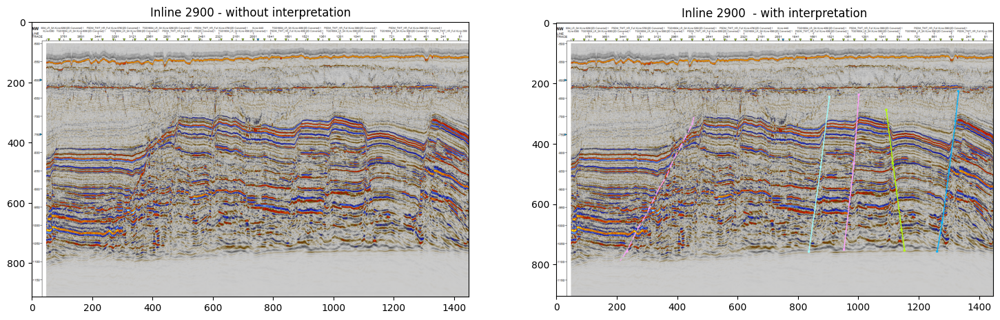

In [190]:
# Load the image from PIL library

image_dir = os.path.join('seismic_images/old/IL/', 'IL2900-')
image1 = Image.open(image_dir + 'without.png')
image2 = Image.open(image_dir + 'with.png')

# Convert the images in numpy format or opencv
# or alternatively using keras.preprocessing to convert image to numpy

np_frame1 = np.array(image1.getdata())
np_frame2 = np.array(image2.getdata())

# By using keras.preprocessing.image for conversion
img_numpy_array1 = img_to_array(image1)
img_numpy_array2 = img_to_array(image2)

# Display the images using Matplotlib
fig = plt.figure(figsize=(18,18))

ax = fig.add_subplot(1, 2, 1)
plt.imshow(image1)
ax.set_title(f'Inline 2900 - without interpretation')

ax = fig.add_subplot(1, 2, 2)
plt.imshow(image2)
ax.set_title(f'Inline 2900  - with interpretation')

Text(0.5, 1.0, 'Labelled Image')

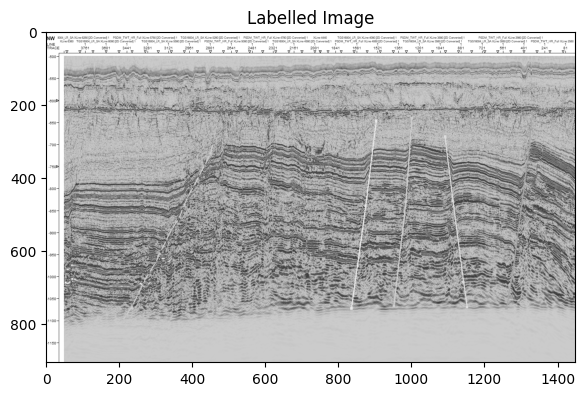

In [191]:
image_path = 'seismic_images/old/IL/IL2900-with.png'

# Opencv grayscale
img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

plt.figure(figsize=(15,15))
plt.subplot(121)
plt.imshow(img,cmap='gray')
plt.title('Labelled Image')

In [192]:
print(img.shape)
img_numpy_array2.shape

(905, 1447)


(905, 1447, 4)

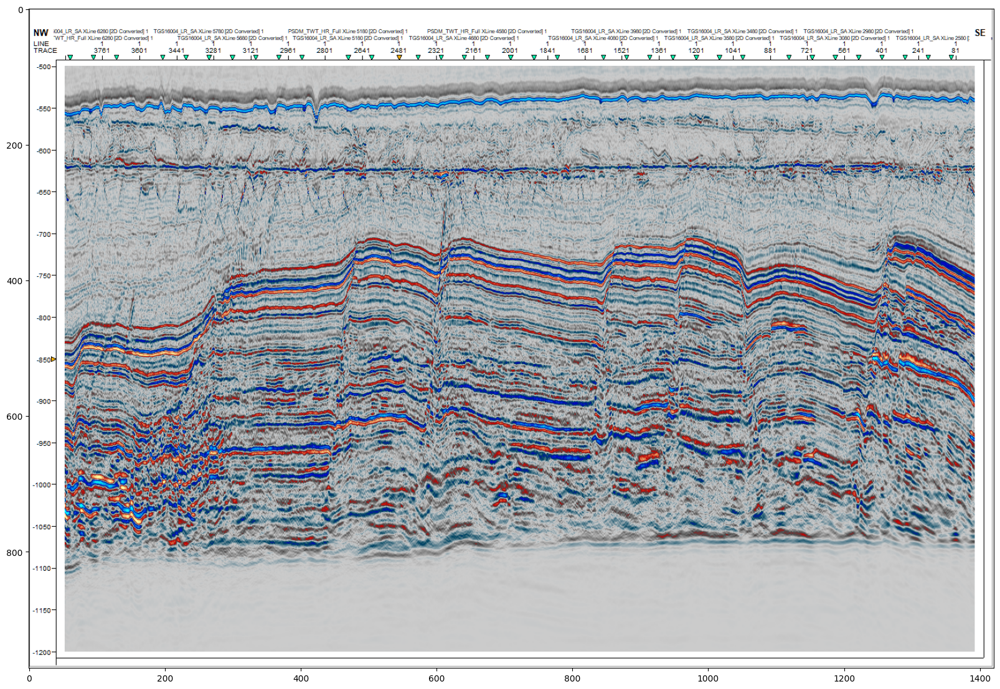

In [193]:
#img_path = os.path.join('seismic_images/images_IL_XL_labels/seismic', 'IL2800.png')
image_path = 'seismic_images/images_IL_XL_labels/seismic/IL2800.png'
seismic_image = cv2.imread(image_path, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(20,16))
plt.imshow(seismic_image)
plt.show()

--------
### 2D Seismic Segy Loading

In [194]:
import re
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import segyio

# Load segy file using segyio package

In [195]:
filename = 'seismic_images/segy/HR-IL2800.sgy'

In [196]:
def FileExists(file):
    if (os.path.isfile(file)):
        print('File exists')
    else:
        print('File does not exist or could not be found')
FileExists(filename)

File exists


In [197]:
# trace header and text header functions

def parse_trace_headers(segyfile, n_traces):
    '''
    Parse the segy file trace headers into a pandas dataframe.
    Column names are defined from segyio internal tracefield
    One row per trace
    '''
    # Get all header keys
    headers = segyio.tracefield.keys
    # Initialize dataframe with trace id as index and headers as columns
    df = pd.DataFrame(index=range(1, n_traces + 1),
                      columns=headers.keys())
    # Fill dataframe with all header values
    for k, v in headers.items():
        df[k] = segyfile.attributes(v)[:]
    return df


def parse_text_header(segyfile):
    '''
    Format segy text header into a readable, clean dict
    '''
    raw_header = segyio.tools.wrap(segyfile.text[0])
    # Cut on C*int pattern
    cut_header = re.split(r'C ', raw_header)[1::]
    # Remove end of line return
    text_header = [x.replace('\n', ' ') for x in cut_header]
    text_header[-1] = text_header[-1][:-2]
    # Format in dict
    clean_header = {}
    i = 1
    for item in text_header:
        key = "C" + str(i).rjust(2, '0')
        i += 1
        clean_header[key] = item
    return clean_header

In [198]:
with segyio.open(filename, ignore_geometry=True) as f:
    # Get basic attributes
    n_traces = f.tracecount
    sample_rate = segyio.tools.dt(f) / 1000
    n_samples = f.samples.size
    twt = f.samples
    data = f.trace.raw[:]  # Get all data into memory (could cause on big files)
    # Load headers - binary header, text header and trace header
    bin_headers = f.bin
    text_headers = parse_text_header(f)
    trace_headers = parse_trace_headers(f, n_traces)
f'N Traces: {n_traces}, N Samples: {n_samples}, Sample rate: {sample_rate}ms'

'N Traces: 3921, N Samples: 701, Sample rate: 1.0ms'

In [199]:
clip_percentile = 99
vm = np.percentile(data, clip_percentile)
f'The {clip_percentile}th percentile is {vm:.0f}; the max amplitude is {data.max():.0f}'

'The 99th percentile is 6; the max amplitude is 19'

Text(0.5, 1.0, 'HR-IL2800.SGY')

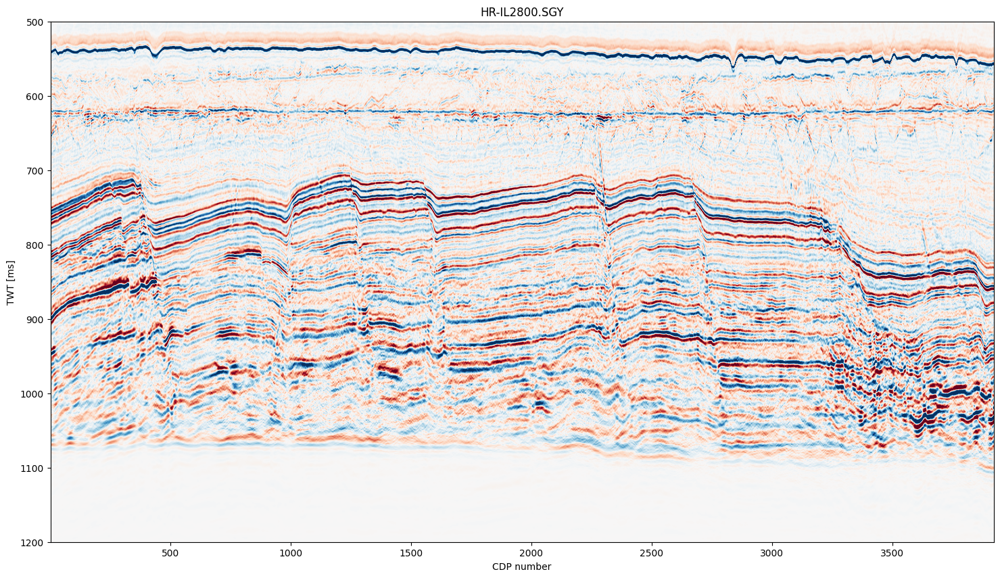

In [200]:
fig = plt.figure(figsize=(18, 10))
ax = fig.add_subplot(1, 1, 1)
extent = [1, n_traces, twt[-1], twt[0]]  # define extent
ax.imshow(data.T, cmap="RdBu", vmin=-vm, vmax=vm, aspect='auto', extent=extent)
# optional colormap "gray_r" or "RdBu"
ax.set_xlabel('CDP number')
ax.set_ylabel('TWT [ms]')
ax.set_title(f'HR-IL2800.SGY')

---------------
### 2D Seismic Images and Labels Input

In [201]:
import os
from os.path import isfile, join
from os import walk
import time
import cv2
import math

In [202]:
def load_pathnames_filenames(path): # read and store all file names in order
    for (_, dirnames, _) in walk(path):
        print("dirnames", dirnames)
        break

    label_path = join(path, dirnames[0])
    seismics_path = join(path, dirnames[1])

    for (_, _, filenames) in walk(label_path):
        labels = sorted(filenames)
    for (_, _, filenames) in walk(seismics_path):
        seismics = sorted(filenames)

    print("number of images in two folder: ",len(labels),len(seismics))
    print("label_path: ", label_path)
    print("seismics_path: ", seismics_path)

    print(labels[:10])
    print(seismics[:10])

    return label_path, seismics_path, labels, seismics

In [203]:
img_path = 'seismic_images/images_IL_XL_labels'
label_path, seismics_path, labels, seismics = load_pathnames_filenames(img_path)

dirnames ['labels', 'seismic']
number of images in two folder:  63 63
label_path:  seismic_images/images_IL_XL_labels\labels
seismics_path:  seismic_images/images_IL_XL_labels\seismic
['IL2800_fault.png', 'IL2900_fault.png', 'IL3000_fault.png', 'IL3100_fault.png', 'IL3200_fault.png', 'IL3300_fault.png', 'IL3400_fault.png', 'IL3500_fault.png', 'IL3600_fault.png', 'IL3700_fault.png']
['IL2800.png', 'IL2900.png', 'IL3000.png', 'IL3100.png', 'IL3200.png', 'IL3300.png', 'IL3400.png', 'IL3500.png', 'IL3600.png', 'IL3700.png']


In [204]:
img = cv2.imread(join(seismics_path,seismics[6]))
mask = cv2.imread(join(label_path,labels[6]))
print(img.shape)
print(mask.shape)

(972, 1421, 3)
(972, 1421, 3)


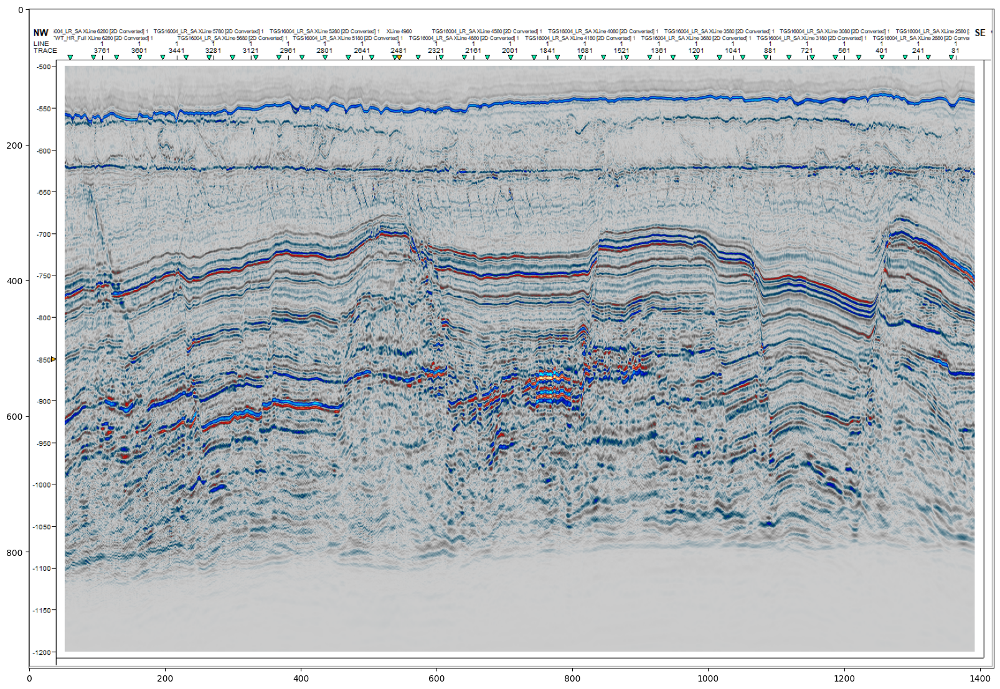

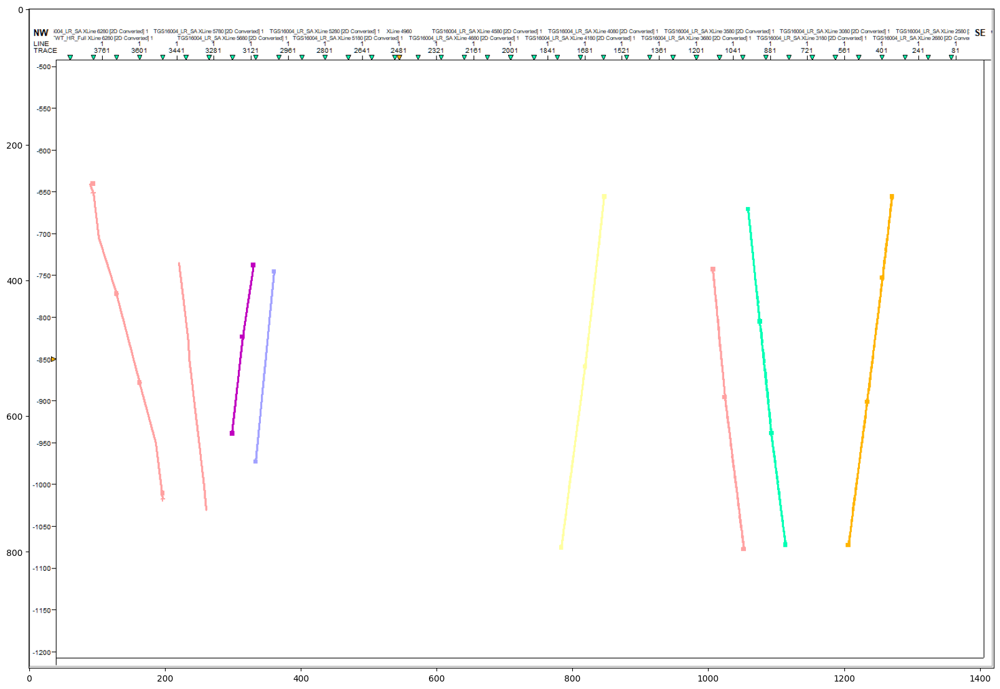

In [205]:
plt.figure(figsize=(20,16))
plt.imshow(img)
plt.show()
plt.figure(figsize=(20,16))
plt.imshow(mask)
plt.show()

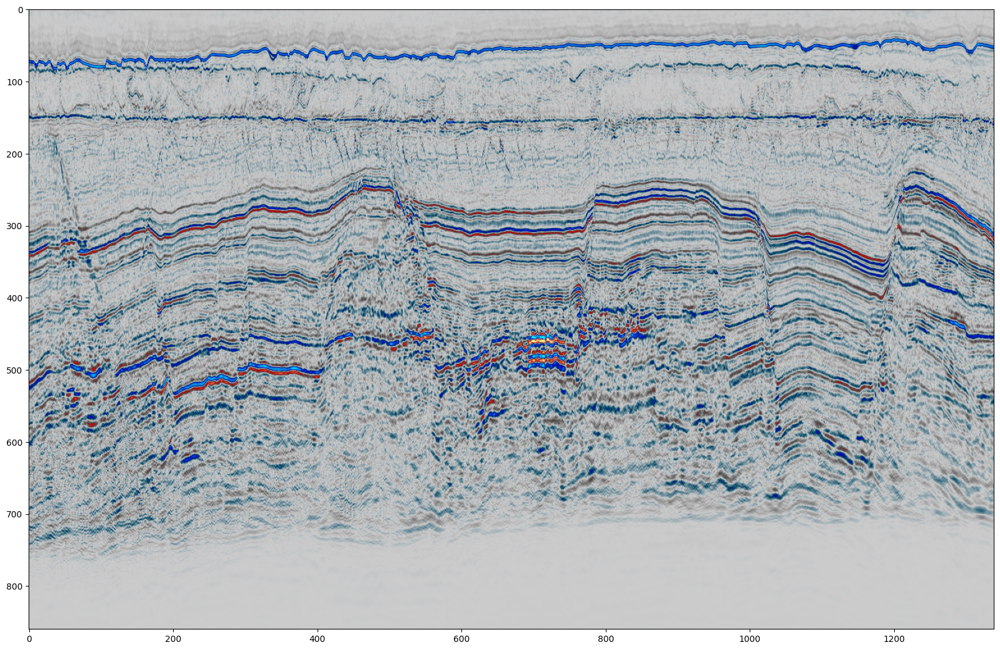

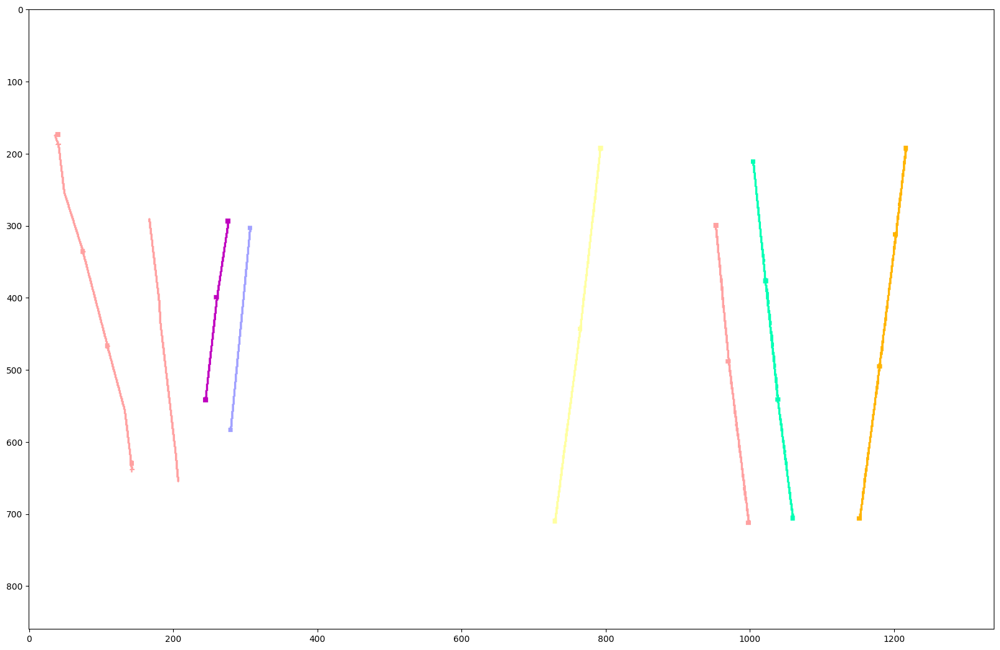

In [206]:
plt.figure(figsize=(20,16))
plt.imshow(img[84:-28,54:-28,:])
plt.show()
plt.figure(figsize=(20,16))
plt.imshow(mask[84:-28,54:-28,:])
plt.show()